<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/College%20Major-ROI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# College Major ROI

Dataset Overview The dataset contains 30,000 entries across 18 columns, covering aspects like major, institution tier, GPA, internship completion, regional location, and various financial metrics such as net cost, debt, and 10-year earnings. Crucially, the data is clean, with no missing values or duplicates, which is excellent for analysis.

Exploratory Data Analysis Highlights
---
`Financial Distributions:` We observed a wide range in financial outcomes. For instance, net_cost_usd, debt_usd, and earnings_10yr_usd show considerable variability, with some right-skewness, suggesting that while many graduates have moderate earnings, a significant portion achieve very high earnings.
Major Categories and Institution Tiers: STEM majors and business-related fields are dominant, and institutions are distributed across mid-tier, regional, and top public categories, with a smaller representation of ivy-elite and for-profit colleges.

`Correlations:` The correlation matrix revealed strong positive relationships between earnings_10yr_usd, net_roi_usd, and roi_pct. This intuitively makes sense: higher earnings generally lead to a better return on investment. GPA, while important, showed a relatively weaker direct correlation with these financial outcomes.
Internship Impact: The bivariate analysis suggested that completing an internship (had_internship) likely positively influences net_roi_usd. This was supported by a t-test which showed a statistically significant difference in ROI between those who had internships and those who didn't (p-value close to zero).

`Institution Tier and ROI:` Similarly, institution tier also plays a significant role in roi_pct, confirmed by a one-way ANOVA test with an extremely low p-value.
Feature Engineering and Modeling Insights We created new features like debt_to_earnings_ratio and academic_capital_score (GPA * Selectivity) and applied transformations such as log-transforming earnings and binning GPA into tiers. These new features proved valuable:

`Predicting Earnings:` A Linear Regression model predicted 10-year added earnings with an R-squared of approximately 0.47, indicating it explains a decent portion of the variance.
Predicting Positive ROI: A Random Forest Classifier achieved an overall accuracy of 86% in predicting whether a graduate would achieve a positive_roi. The classification report showed good precision and recall for predicting positive ROI (Class 1), though it struggled more with identifying negative ROI cases (Class 0).
Feature Importance: The most influential features in predicting positive ROI were debt_to_earnings_ratio, net_cost_usd, and academic_capital_score. This highlights the critical role of managing debt relative to earning potential, the initial cost of education, and a student's combined academic strength and institutional prestige.

`Clustering:` K-Means clustering helped identify distinct graduate typologies based on financial metrics, revealing different profiles such as those with high debt/high earnings, low debt/moderate earnings, and other combinations.
In summary, the analysis strongly indicates that factors like internship experience, institution tier, academic performance combined with institutional selectivity, and the ratio of debt to future earnings are pivotal in determining a college graduate's financial return on investment. While some variables are more predictive than others, a holistic view is essential for understanding these complex outcomes.

---

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [6]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d sergionefedov/college-major-roi

# Unziping the downloaded file
!unzip college-major-roi.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/sergionefedov/college-major-roi
License(s): CC0-1.0
100% 820k/820k [00:00<00:00, 922kB/s]

Archive:  college-major-roi.zip
  inflating: college_major_roi.csv   
  inflating: data_dictionary (6).csv  


In [7]:
df = pd.read_csv('college_major_roi.csv')
df.head(11)

,grad_id,major,major_category,institution_tier,institution_selectivity_pctile,gpa,had_internship,completed_on_time,region,net_cost_usd,debt_usd,hs_baseline_10yr_usd,added_earnings_10yr_usd,earnings_10yr_usd,net_roi_usd,roi_pct,positive_roi,high_roi
0,G000000,biology,STEM,mid_tier,52,2.58,0,0,south,144400,0,411700,101000,512700,-43400,-30.0,0,0
1,G000001,marketing,business,mid_tier,61,2.58,0,1,northeast,57400,0,356900,330600,687500,273200,476.1,1,0
2,G000002,electrical_engineering,STEM,top_public,78,3.14,1,1,northeast,65100,39600,339600,655100,994700,590000,906.4,1,1
3,G000003,marketing,business,top_public,77,3.04,0,1,midwest,105800,81300,399600,197500,597100,91700,86.8,1,0
4,G000004,marketing,business,ivy_elite,100,3.81,0,0,south,219200,93500,335700,222900,558600,3800,1.7,1,0
5,G000005,business,business,regional,37,3.91,1,0,northeast,79000,0,413800,466800,880600,387900,491.2,1,0
6,G000006,economics,business,regional,44,2.32,1,1,midwest,39500,0,388800,405200,794100,365800,926.3,1,0
7,G000007,social_work,social_science,mid_tier,59,4.00,1,1,midwest,59300,43500,350300,162400,512600,103100,174.0,1,0
8,G000008,mechanical_engineering,STEM,regional,45,3.61,0,1,northeast,62200,0,314300,344500,658800,282300,454.2,1,0
9,G000009,finance,business,top_public,79,2.46,1,0,south,109000,107500,307200,438000,745200,329000,301.8,1,0


In [4]:
df.tail(11)

,grad_id,major,major_category,institution_tier,institution_selectivity_pctile,gpa,had_internship,completed_on_time,region,net_cost_usd,debt_usd,hs_baseline_10yr_usd,added_earnings_10yr_usd,earnings_10yr_usd,net_roi_usd,roi_pct,positive_roi,high_roi
29989,G029989,criminal_justice,social_science,regional,38,2.65,0,1,midwest,72400,66700,387500,86100,473600,13700,18.9,1,0
29990,G029990,nursing,health,top_public,71,3.27,1,0,south,130500,0,305100,621100,926200,490600,375.8,1,1
29991,G029991,chemical_engineering,STEM,mid_tier,56,2.66,1,0,south,104600,0,407800,288600,696400,184000,175.8,1,0
29992,G029992,computer_engineering,STEM,top_public,80,2.80,1,0,midwest,87100,0,379600,838400,1218000,751300,862.5,1,1
29993,G029993,economics,business,regional,45,2.97,1,1,midwest,60900,58200,350300,603700,954000,542800,891.9,1,1
29994,G029994,fine_arts,arts,mid_tier,58,2.55,0,1,west,73700,60100,393600,41600,435200,-32000,-43.5,0,0
29995,G029995,electrical_engineering,STEM,top_public,71,3.47,1,1,south,71900,0,338500,521600,860100,449700,625.4,1,1
29996,G029996,humanities,humanities,regional,46,3.62,0,1,south,61300,41300,378100,55400,433500,-5900,-9.6,0,0
29997,G029997,economics,business,for_profit,26,3.34,0,1,west,154000,0,432900,406500,839400,252500,163.9,1,0
29998,G029998,social_work,social_science,mid_tier,58,2.95,0,0,northeast,124100,50300,423300,53500,476800,-70500,-56.9,0,0


In [5]:
df.shape

(30000, 18)

In [6]:
df.columns

Index(['grad_id', 'major', 'major_category', 'institution_tier',
       'institution_selectivity_pctile', 'gpa', 'had_internship',
       'completed_on_time', 'region', 'net_cost_usd', 'debt_usd',
       'hs_baseline_10yr_usd', 'added_earnings_10yr_usd', 'earnings_10yr_usd',
       'net_roi_usd', 'roi_pct', 'positive_roi', 'high_roi'],
      dtype='object')

In [7]:
df.dtypes

,0
grad_id,object
major,object
major_category,object
institution_tier,object
institution_selectivity_pctile,int64
gpa,float64
had_internship,int64
completed_on_time,int64
region,object
net_cost_usd,int64


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   grad_id                         30000 non-null  object 
 1   major                           30000 non-null  object 
 2   major_category                  30000 non-null  object 
 3   institution_tier                30000 non-null  object 
 4   institution_selectivity_pctile  30000 non-null  int64  
 5   gpa                             30000 non-null  float64
 6   had_internship                  30000 non-null  int64  
 7   completed_on_time               30000 non-null  int64  
 8   region                          30000 non-null  object 
 9   net_cost_usd                    30000 non-null  int64  
 10  debt_usd                        30000 non-null  int64  
 11  hs_baseline_10yr_usd            30000 non-null  int64  
 12  added_earnings_10yr_usd         

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
institution_selectivity_pctile,30000.0,55.086067,18.593708,16.0,42.00,55.0,68.00,102.0
gpa,30000.0,3.093337,0.439060,1.5,2.79,3.1,3.40,4.0
had_internship,30000.0,0.436067,0.495904,0.0,0.00,0.0,1.00,1.0
completed_on_time,30000.0,0.682367,0.465564,0.0,0.00,1.0,1.00,1.0
net_cost_usd,30000.0,88621.496667,33576.903160,28500.0,65500.00,81000.0,103600.00,352900.0
debt_usd,30000.0,38498.063333,37801.748200,0.0,0.00,38700.0,62300.00,331700.0
hs_baseline_10yr_usd,30000.0,359893.416667,39923.943255,250000.0,333100.00,359700.0,387300.00,480000.0
added_earnings_10yr_usd,30000.0,355475.166667,294810.871798,10000.0,117900.00,283650.0,509300.00,2894900.0
earnings_10yr_usd,30000.0,715368.020000,297784.743377,272300.0,483500.00,645800.0,871700.00,3245500.0
net_roi_usd,30000.0,266853.716667,294995.760415,-305200.0,32800.00,198100.0,423525.00,2755100.0


In [10]:
df.isnull().sum()

,0
grad_id,0
major,0
major_category,0
institution_tier,0
institution_selectivity_pctile,0
gpa,0
had_internship,0
completed_on_time,0
region,0
net_cost_usd,0


In [11]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

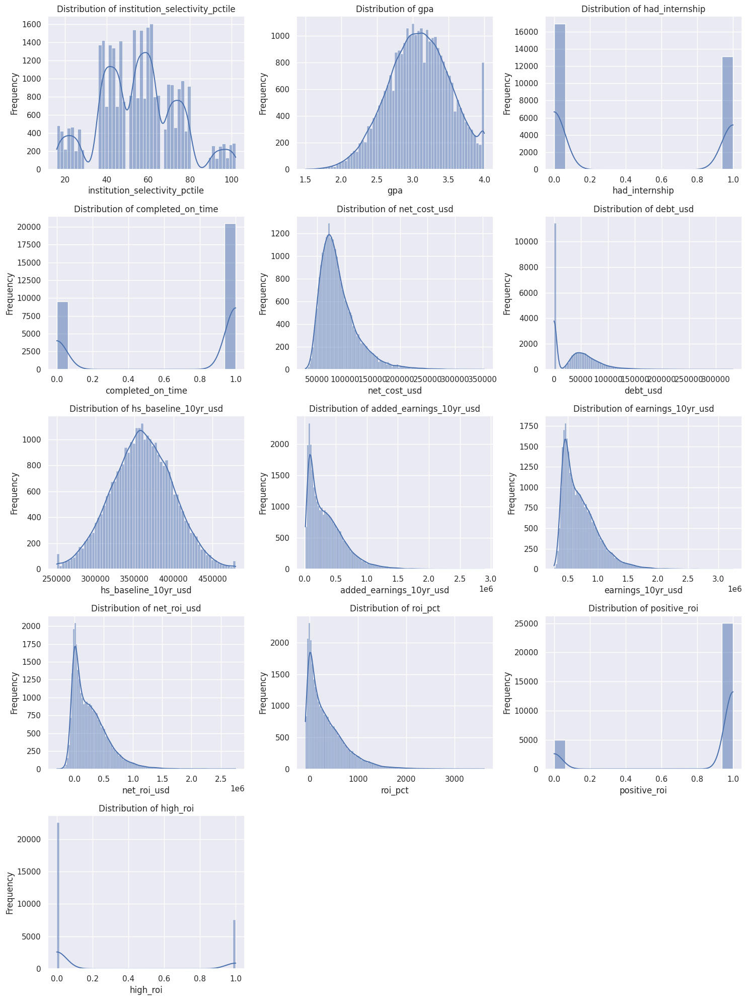

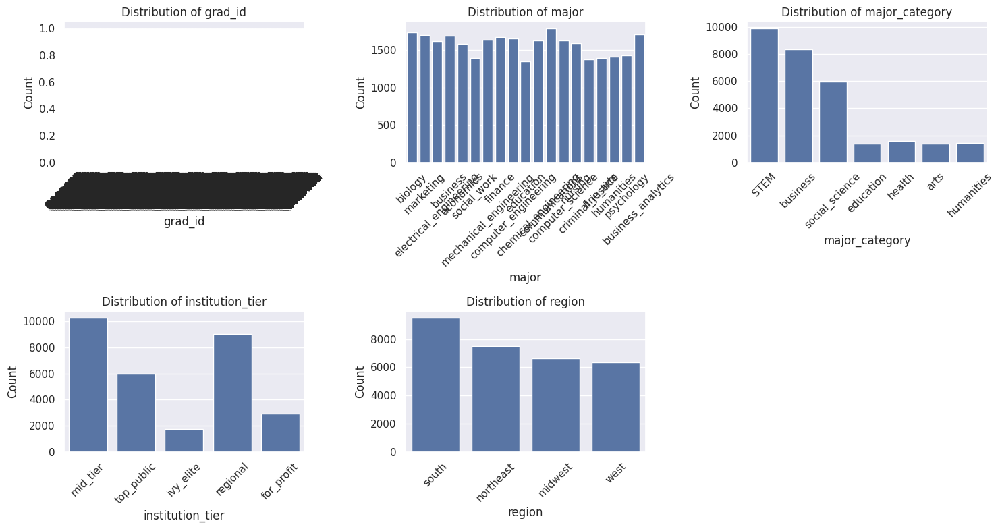

--- Categorical Value Counts ---

Value counts for grad_id:
grad_id
G029999    1
G000000    1
G000001    1
G000002    1
G000003    1
          ..
G000019    1
G000020    1
G000021    1
G000022    1
G000023    1
Name: count, Length: 30000, dtype: int64

Value counts for major:
major
communications            1788
biology                   1735
business_analytics        1708
marketing                 1703
business                  1694
finance                   1676
computer_engineering      1659
mechanical_engineering    1635
computer_science          1628
chemical_engineering      1626
electrical_engineering    1621
nursing                   1589
economics                 1580
psychology                1429
humanities                1410
social_work               1396
fine_arts                 1395
criminal_justice          1376
education                 1352
Name: count, dtype: int64

Value counts for major_category:
major_category
STEM              9904
business          8361
social_

In [12]:
import math
# --- 1. Numerical Columns (Histograms in a Grid) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

if len(numerical_cols) > 0:
    # Define grid size
    num_plots = len(numerical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterate and plot
    for i, col in enumerate(numerical_cols):
        sns.histplot(data=df, x=col, kde=True, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Frequency')

    # Hidding any unused subplots (if total plots < grid cells)
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns found.")


# --- 2. Categorical Columns (Countplots in a Grid) ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()

if len(categorical_cols) > 0:
    # Define grid size
    num_plots = len(categorical_cols)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    # Create figure and axes
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    axes = axes.flatten()

    # Iterate and plot
    for i, col in enumerate(categorical_cols):
        sns.countplot(data=df, x=col, ax=axes[i])
        axes[i].set_title(f'Distribution of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Count')
        axes[i].tick_params(axis='x', rotation=45)

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

    # --- 3. Value Counts (Text Output) ---
    print("--- Categorical Value Counts ---")
    for col in categorical_cols:
        print(f"\nValue counts for {col}:")
        print(df[col].value_counts())
else:
    print("No categorical columns found.")

# Bivariate Analysis

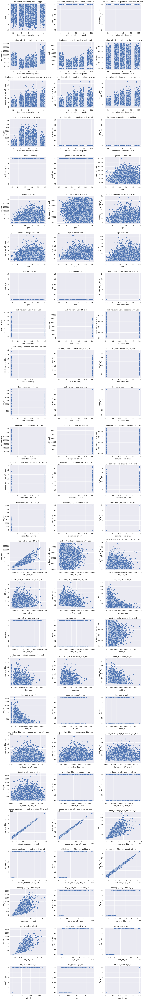

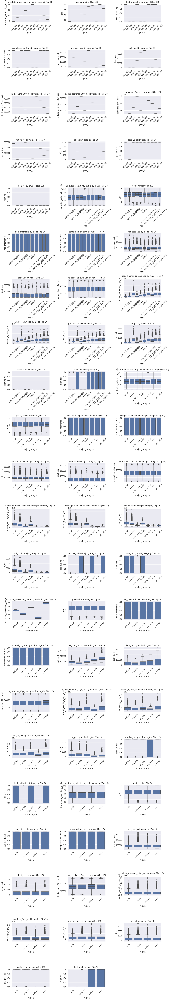

In [13]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, (col1, col2) in enumerate(num_pairs):
        sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i])
        axes[i].set_title(f'{col1} vs {col2}')
        axes[i].set_xlabel(col1)
        axes[i].set_ylabel(col2)

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generating all pairs of (Categorical, Numerical)
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    if num_plots == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        # 1. Get top 10 categories based on frequency
        top_categories = df[cat_col].value_counts().nlargest(10).index.tolist()

        # 2. Filter data: Keep only top categories AND ensure numerical column is not NaN
        filtered_df = df[df[cat_col].isin(top_categories) & df[num_col].notnull()]

        # 3. Updating 'order' to only include categories that exist in the filtered data
        # This prevents the ValueError where a category in 'order' has no data to plot
        valid_categories = [cat for cat in top_categories if cat in filtered_df[cat_col].unique()]

        if valid_categories:
            sns.boxplot(data=filtered_df, x=cat_col, y=num_col, ax=axes[i], order=valid_categories)
            axes[i].set_title(f'{num_col} by {cat_col} (Top 10)')
            axes[i].set_xlabel(cat_col)
            axes[i].set_ylabel(num_col)
            axes[i].tick_params(axis='x', rotation=45)
        else:
             axes[i].text(0.5, 0.5, "No valid data", ha='center', va='center')

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")

# Multivariate Analysis

In [13]:
import itertools
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Prepare Data for Multivariate Plotting
# Extract Year to use as the 3rd dimension (Color/Hue)
if 'Date' in df.columns:
    df['Year'] = df['Date'].dt.year
else:
    print("Date column missing, using index for year approximation if possible.")
    df['Year'] = df.index.year if hasattr(df.index, 'year') else range(len(df))

# Define the variables to analyze
metals = ['Gold_Price', 'Silver_Price', 'Platinum_Price']

# Generate all unique pairs of metals
metal_pairs = list(itertools.combinations(metals, 2))

print("--- Multivariate Scatter Plots (Color = Year) ---")
plt.figure(figsize=(18, 5))

# Loop through each pair and plot
for i, (col_x, col_y) in enumerate(metal_pairs):
    plt.subplot(1, 3, i + 1)

    # Plot: X vs Y, colored by Year
    sns.scatterplot(
        data=df,
        x=col_x,
        y=col_y,
        hue='Year',
        palette='viridis',
        alpha=0.8,
        edgecolor=None
    )

    plt.title(f'{col_x} vs {col_y}\n(Evolution over Years)')
    plt.grid(True, alpha=0.3)

    # Simplify legend
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Year')

plt.tight_layout()
plt.show()

# Pairplot

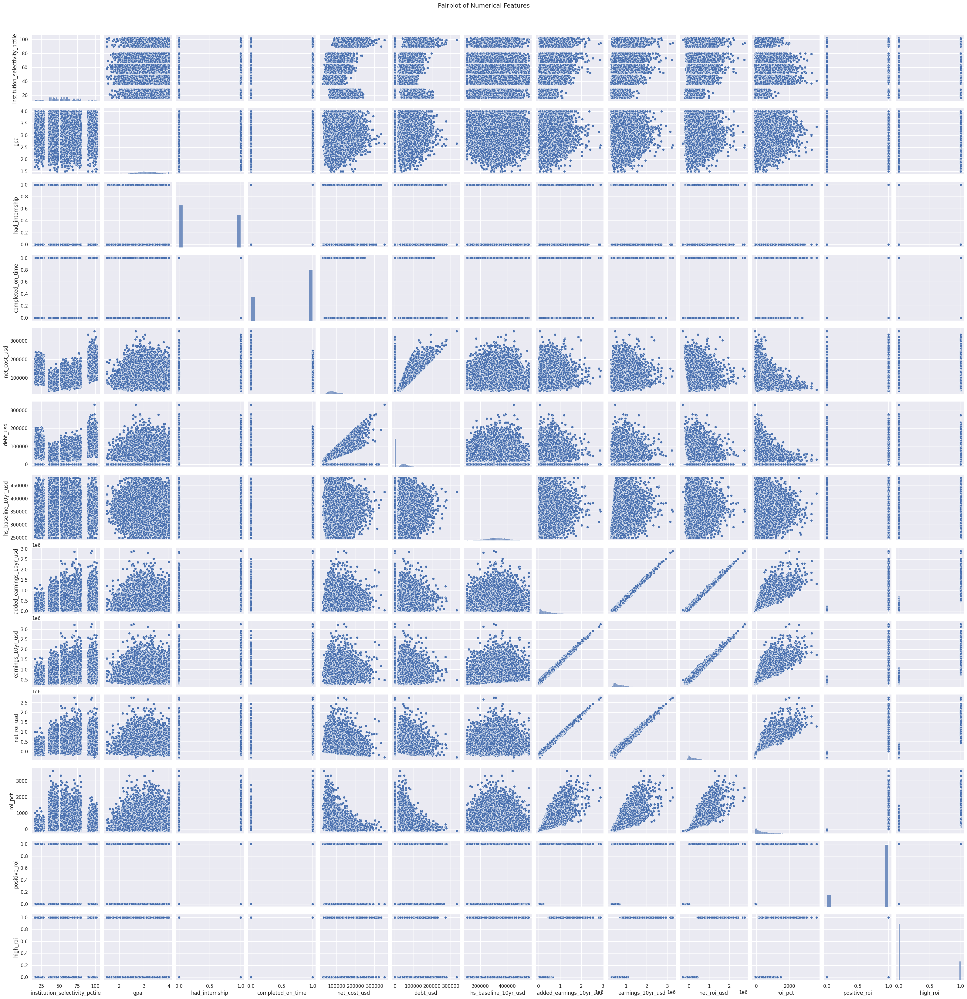

In [14]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

# HeatMap

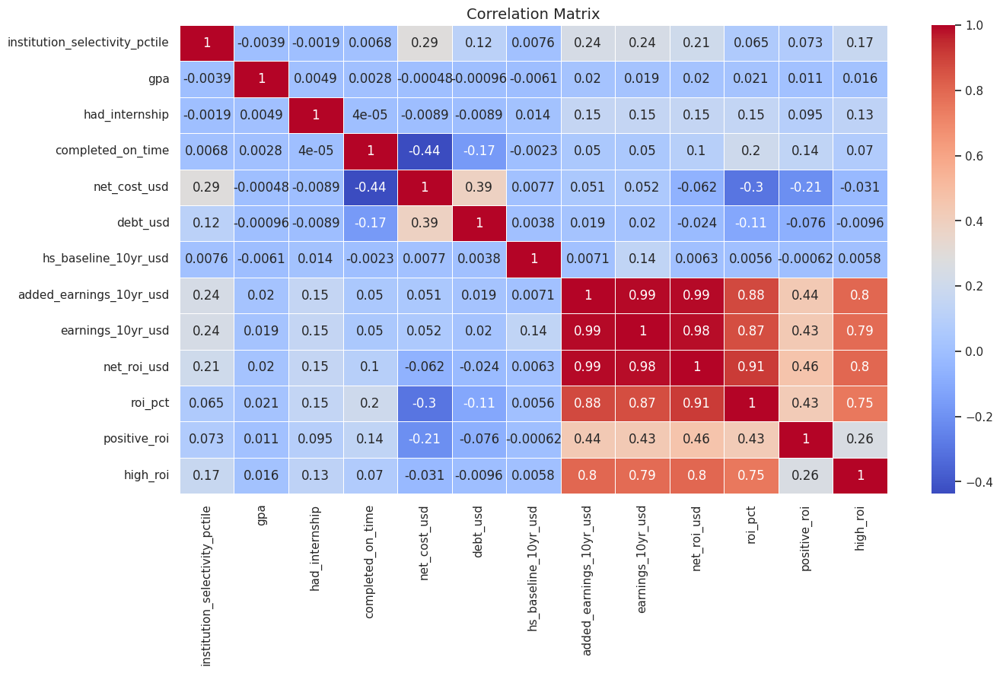

In [15]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Statistical Analysis

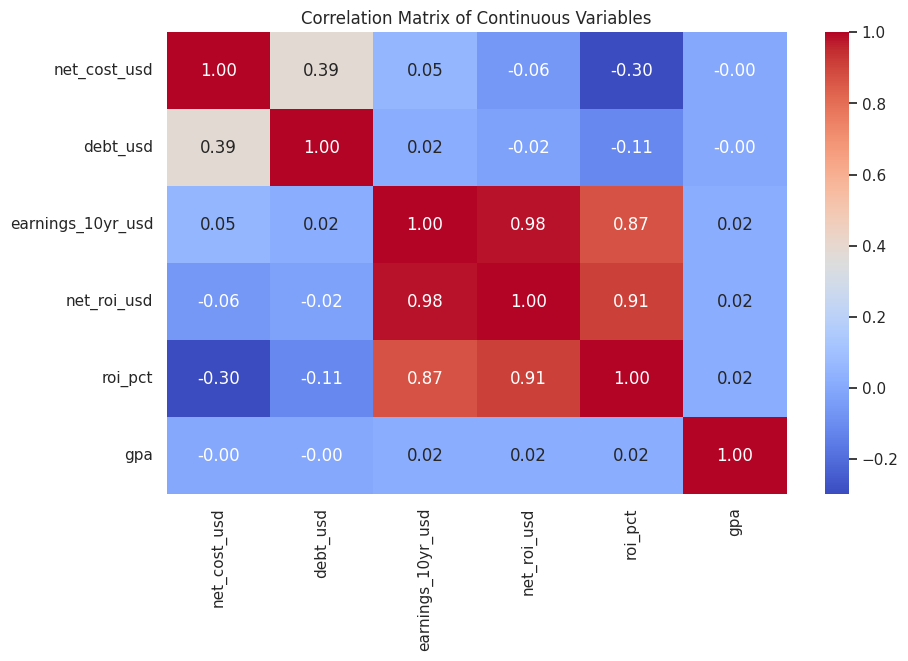

Internship T-Test: t-statistic = 26.71, p-value = 4.8840e-155
Institution Tier ANOVA: F-statistic = 391.95, p-value = 0.0000e+00

Linear Regression R-Squared: 0.4683

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.34      0.07      0.12      1004
           1       0.84      0.97      0.90      4996

    accuracy                           0.82      6000
   macro avg       0.59      0.52      0.51      6000
weighted avg       0.76      0.82      0.77      6000


K-Means Cluster Centers (Standardized):
[[-0.40003382  0.35806718 -0.42988226]
 [-0.08376815 -1.01843716 -0.387138  ]
 [-0.21709074 -0.17105908  1.54973204]
 [ 1.64798376  1.53493834 -0.0257514 ]]


In [8]:
import scipy.stats as stats
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, classification_report
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# ==========================================
# 1. Correlation Matrix & Heatmap
# ==========================================
# Check for multicollinearity and linear relationships among key numerical features
num_cols = ['net_cost_usd', 'debt_usd', 'earnings_10yr_usd', 'net_roi_usd', 'roi_pct', 'gpa']
corr_matrix = df[num_cols].corr()

plt.figure(figsize=(10, 6))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Continuous Variables')
plt.show()

# ==========================================
# 2. Hypothesis Testing (Inferential Statistics)
# ==========================================
# Independent T-Test (Welch's): Does net ROI differ based on completing an internship?
internship_yes = df[df['had_internship'] == 1]['net_roi_usd']
internship_no = df[df['had_internship'] == 0]['net_roi_usd']

# stats.ttest_ind() checks if the means of two independent groups are significantly different from each other
t_stat, p_val_t = stats.ttest_ind(internship_yes, internship_no, equal_var=False)
print(f"Internship T-Test: t-statistic = {t_stat:.2f}, p-value = {p_val_t:.4e}")

# One-Way ANOVA: Does the ROI percentage differ significantly across institution tiers?
tiers = df['institution_tier'].unique()
tier_groups = [df[df['institution_tier'] == tier]['roi_pct'] for tier in tiers]

# stats.f_oneway() is used to perform a one-way ANOVA test, which checks if the means of three or more independent groups are significantly different
f_stat, p_val_f = stats.f_oneway(*tier_groups)
print(f"Institution Tier ANOVA: F-statistic = {f_stat:.2f}, p-value = {p_val_f:.4e}")

# ==========================================
# 3. Advanced Predictive Modeling
# ==========================================
# Multiple Linear Regression: Predicting 10-year added earnings
features_lr = ['gpa', 'institution_selectivity_pctile']
# Dummy encoding categorical major data
X_lr = pd.get_dummies(df[features_lr + ['major_category']], drop_first=True)
y_lr = df['added_earnings_10yr_usd']

X_train_lr, X_test_lr, y_train_lr, y_test_lr = train_test_split(X_lr, y_lr, test_size=0.2, random_state=42)
lr_model = LinearRegression()
lr_model.fit(X_train_lr, y_train_lr)
y_pred_lr = lr_model.predict(X_test_lr)
print(f"\nLinear Regression R-Squared: {r2_score(y_test_lr, y_pred_lr):.4f}")

# Random Forest Classification: Predicting if a student achieves a 'positive_roi'
features_rf = ['gpa', 'institution_selectivity_pctile', 'net_cost_usd', 'debt_usd']
X_rf = pd.get_dummies(df[features_rf + ['institution_tier']], drop_first=True)
y_rf = df['positive_roi']

X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf, y_rf, test_size=0.2, random_state=42)
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train_rf, y_train_rf)
y_pred_rf = rf_model.predict(X_test_rf)
print("\nRandom Forest Classification Report:")
print(classification_report(y_test_rf, y_pred_rf))

# ==========================================
# 4. K-Means Clustering
# ==========================================
# Discover hidden graduate typologies (e.g., high-debt/high-reward)
cluster_vars = ['net_cost_usd', 'debt_usd', 'earnings_10yr_usd']
X_cluster = df[cluster_vars]

# Standardizing inputs before distance-based clustering
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_cluster)

kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
df['cluster_label'] = kmeans.fit_predict(X_scaled)
print("\nK-Means Cluster Centers (Standardized):")
print(kmeans.cluster_centers_)

# Feature Engineering

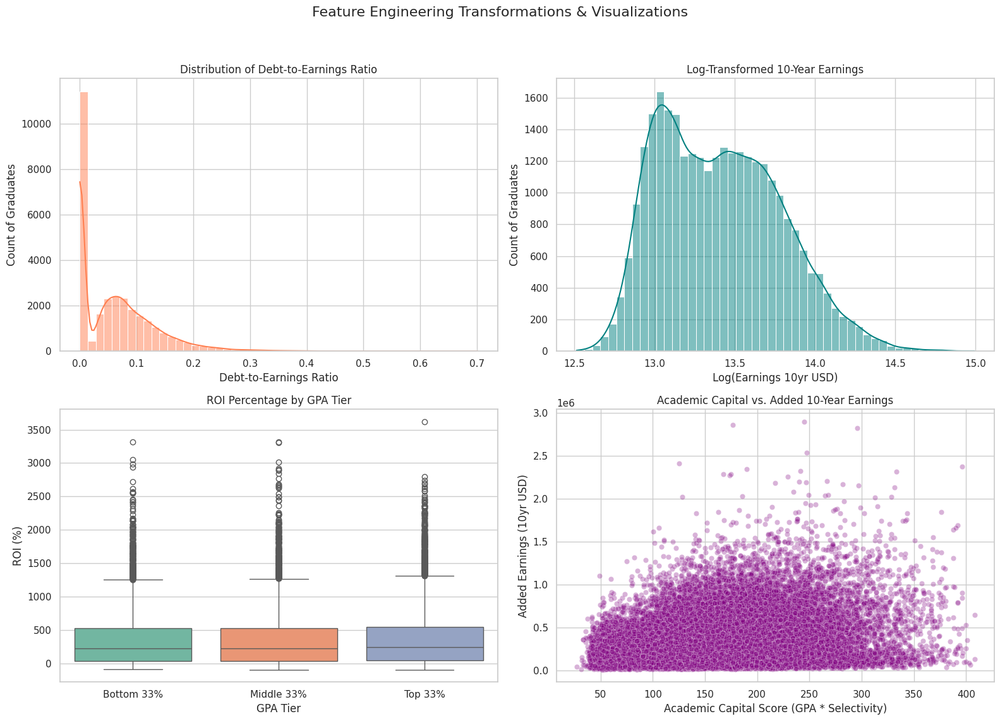

Newly created features preview:
   debt_to_earnings_ratio  log_earnings_10yr gpa_tier_label  \
0                0.000000          13.147448     Bottom 33%   
1                0.000000          13.440819     Bottom 33%   
2                0.039811          13.810197     Middle 33%   
3                0.136158          13.299842     Middle 33%   
4                0.167382          13.233191        Top 33%   

   academic_capital_score  
0                  134.16  
1                  157.38  
2                  244.92  
3                  234.08  
4                  381.00  


In [9]:
from sklearn.preprocessing import KBinsDiscretizer

# Assuming 'df' is your loaded College Major ROI dataset

# Set visualization style
sns.set_theme(style="whitegrid")
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Feature Engineering Transformations & Visualizations', fontsize=16)

# ==========================================
# 1. Feature Construction: Debt-to-Earnings Ratio
# ==========================================
# Creating a ratio to measure debt burden relative to 10-year earnings
df['debt_to_earnings_ratio'] = df['debt_usd'] / (df['earnings_10yr_usd'] + 1) # +1 to avoid division by zero

sns.histplot(df['debt_to_earnings_ratio'], bins=50, kde=True, ax=axes[0, 0], color='coral')
axes[0, 0].set_title('Distribution of Debt-to-Earnings Ratio')
axes[0, 0].set_xlabel('Debt-to-Earnings Ratio')
axes[0, 0].set_ylabel('Count of Graduates')

# ==========================================
# 2. Log Transformation: Normalizing Financial Data
# ==========================================
# Financial data is often right-skewed; a log transformation helps linearize relationships for models
df['log_earnings_10yr'] = np.log1p(df['earnings_10yr_usd'])

sns.histplot(df['log_earnings_10yr'], bins=50, kde=True, ax=axes[0, 1], color='teal')
axes[0, 1].set_title('Log-Transformed 10-Year Earnings')
axes[0, 1].set_xlabel('Log(Earnings 10yr USD)')
axes[0, 1].set_ylabel('Count of Graduates')

# ==========================================
# 3. Binning/Discretization: Creating GPA Tiers
# ==========================================
# Converting continuous GPA into distinct categorical tiers (e.g., Low, Medium, High)
est = KBinsDiscretizer(n_bins=3, encode='ordinal', strategy='quantile')
df['gpa_tier'] = est.fit_transform(df[['gpa']])

# Mapping numeric bins to descriptive labels
gpa_labels = {0.0: 'Bottom 33%', 1.0: 'Middle 33%', 2.0: 'Top 33%'}
df['gpa_tier_label'] = df['gpa_tier'].map(gpa_labels)

sns.boxplot(x='gpa_tier_label', y='roi_pct', data=df, ax=axes[1, 0], palette='Set2', order=['Bottom 33%', 'Middle 33%', 'Top 33%'])
axes[1, 0].set_title('ROI Percentage by GPA Tier')
axes[1, 0].set_xlabel('GPA Tier')
axes[1, 0].set_ylabel('ROI (%)')

# ==========================================
# 4. Feature Interaction: Academic Merit & Institution Prestige
# ==========================================
# Multiplying GPA by Institution Selectivity to create a composite "Academic Capital" score
df['academic_capital_score'] = df['gpa'] * df['institution_selectivity_pctile']

sns.scatterplot(x='academic_capital_score', y='added_earnings_10yr_usd', data=df, alpha=0.3, ax=axes[1, 1], color='purple')
axes[1, 1].set_title('Academic Capital vs. Added 10-Year Earnings')
axes[1, 1].set_xlabel('Academic Capital Score (GPA * Selectivity)')
axes[1, 1].set_ylabel('Added Earnings (10yr USD)')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# ==========================================
# 5. One-Hot Encoding (Categorical to Numeric)
# ==========================================
# Converting 'region' into binary dummy variables for machine learning models
# We drop the first category to avoid the dummy variable trap (perfect multicollinearity)
df_encoded = pd.get_dummies(df, columns=['region'], drop_first=True)

print("Newly created features preview:")
print(df[['debt_to_earnings_ratio', 'log_earnings_10yr', 'gpa_tier_label', 'academic_capital_score']].head())

# Machine Learning

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.26      0.38       989
           1       0.87      0.98      0.92      5011

    accuracy                           0.86      6000
   macro avg       0.79      0.62      0.65      6000
weighted avg       0.84      0.86      0.83      6000



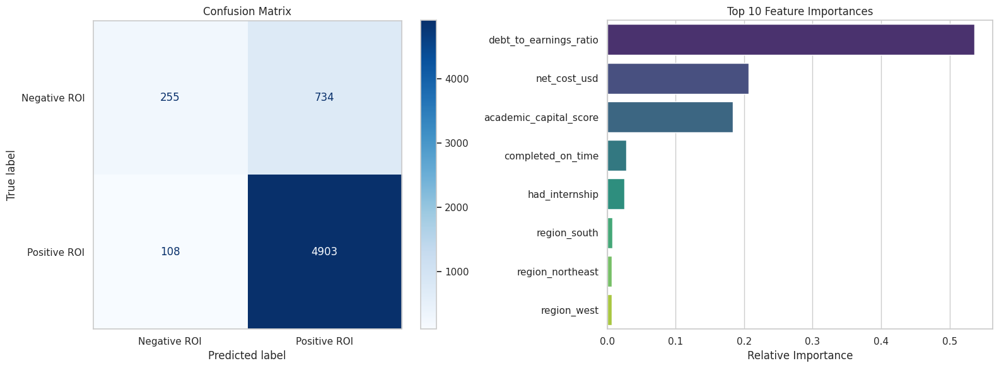

In [10]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# Assuming df_encoded contains the engineered features from the previous step

# ==========================================
# 1. Define Features and Target
# ==========================================
# Select our engineered features alongside baseline variables
feature_cols = [
    'academic_capital_score',  # Engineered: GPA * Selectivity
    'debt_to_earnings_ratio',  # Engineered: Debt burden
    'net_cost_usd',
    'had_internship',
    'completed_on_time'
]

# Add in the dummy variables created for 'region' or 'major_category' if they exist
# For this example, we'll grab any column starting with 'region_'
region_cols = [col for col in df_encoded.columns if col.startswith('region_')]
X = df_encoded[feature_cols + region_cols]

# Target variable: Predicting binary success
y = df_encoded['positive_roi']

# ==========================================
# 2. Train-Test Split
# ==========================================
# Stratify ensures the split maintains the same proportion of positive/negative ROI in both sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# ==========================================
# 3. Model Training
# ==========================================
# Initialize and train the Random Forest
rf_classifier = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=42, n_jobs=-1)
rf_classifier.fit(X_train, y_train)

# ==========================================
# 4. Evaluation & Metrics
# ==========================================
y_pred = rf_classifier.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

# Plot the Confusion Matrix
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Negative ROI', 'Positive ROI'])
disp.plot(cmap='Blues', ax=ax[0], values_format='d')
ax[0].set_title('Confusion Matrix')
ax[0].grid(False) # Turn off grid for cleaner matrix visualization

# ==========================================
# 5. Feature Importance Extraction
# ==========================================
# Determine which features actually drove the model's decisions
importances = rf_classifier.feature_importances_
feature_names = X.columns
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False).head(10) # Top 10

sns.barplot(x='Importance', y='Feature', data=importance_df, ax=ax[1], palette='viridis')
ax[1].set_title('Top 10 Feature Importances')
ax[1].set_xlabel('Relative Importance')
ax[1].set_ylabel('')

plt.tight_layout()
plt.show()

# Thank You